# 14- Gradient Boosting Machines - Alıştırmalar

* Gradient Boosting Machines türleri,
* Extreme Gradient Boosting
* Light Gradient Boosting
* CatBoost Gradient

## Alıştırma - 1

### Verisetinin İncelenmesi ve Manipüle Edilmesi

In [2]:
# Gerekli kütüphanelerin dahil edilmesi,
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from pandas import MultiIndex, Int64Index
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", category = UserWarning)

* Verisetini [buradan](https://mrkizmaz-s3data.s3.eu-west-1.amazonaws.com/DataSets/FuelConsumption.csv) indirebilirsiniz.

In [3]:
url = "https://mrkizmaz-s3data.s3.eu-west-1.amazonaws.com/DataSets/FuelConsumption.csv"

fuelcons = pd.read_csv(url)
df = fuelcons.copy()
df.head()

,MODELYEAR,MAKE,MODEL,VEHICLECLASS,ENGINESIZE,CYLINDERS,TRANSMISSION,FUELTYPE,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
0,2014,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,2014,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,2014,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,2014,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,2014,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


In [4]:
df.isnull().values.any() # verisetinde bos degerler var mı?

False

In [5]:
df.info() # verisetinin bilgi cıktısını verir

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1067 entries, 0 to 1066
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   MODELYEAR                 1067 non-null   int64  
 1   MAKE                      1067 non-null   object 
 2   MODEL                     1067 non-null   object 
 3   VEHICLECLASS              1067 non-null   object 
 4   ENGINESIZE                1067 non-null   float64
 5   CYLINDERS                 1067 non-null   int64  
 6   TRANSMISSION              1067 non-null   object 
 7   FUELTYPE                  1067 non-null   object 
 8   FUELCONSUMPTION_CITY      1067 non-null   float64
 9   FUELCONSUMPTION_HWY       1067 non-null   float64
 10  FUELCONSUMPTION_COMB      1067 non-null   float64
 11  FUELCONSUMPTION_COMB_MPG  1067 non-null   int64  
 12  CO2EMISSIONS              1067 non-null   int64  
dtypes: float64(4), int64(4), object(5)
memory usage: 108.5+ KB


In [6]:
# modelyear veriseti bilgisinde int olarak görünüyor, aslında datetime olması gerekir.
df["MODELYEAR"] = pd.to_datetime(df["MODELYEAR"]) 

In [7]:
df.corr() # verisetinin degiskenleri arasındaki korelasyon durumu

,ENGINESIZE,CYLINDERS,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
ENGINESIZE,1.000000,0.934011,0.832225,0.778746,0.819482,-0.808554,0.874154
CYLINDERS,0.934011,1.000000,0.796473,0.724594,0.776788,-0.770430,0.849685
FUELCONSUMPTION_CITY,0.832225,0.796473,1.000000,0.965718,0.995542,-0.935613,0.898039
FUELCONSUMPTION_HWY,0.778746,0.724594,0.965718,1.000000,0.985804,-0.893809,0.861748
FUELCONSUMPTION_COMB,0.819482,0.776788,0.995542,0.985804,1.000000,-0.927965,0.892129
FUELCONSUMPTION_COMB_MPG,-0.808554,-0.770430,-0.935613,-0.893809,-0.927965,1.000000,-0.906394
CO2EMISSIONS,0.874154,0.849685,0.898039,0.861748,0.892129,-0.906394,1.000000


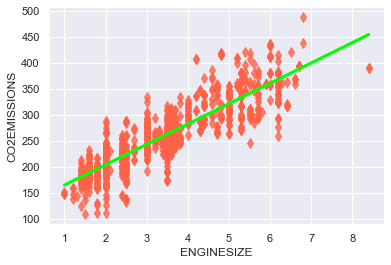

In [9]:
# enginesize ve co2emission görsel durumu
sns.set_theme(color_codes = True)
sns.regplot(data = df, x = 'ENGINESIZE', y = 'CO2EMISSIONS', 
            ci = 60, 
            marker = 'd', 
            scatter_kws = {'s': 50, 'color' : 'tomato'},
            line_kws = {'lw':3, 'color': 'lime'});

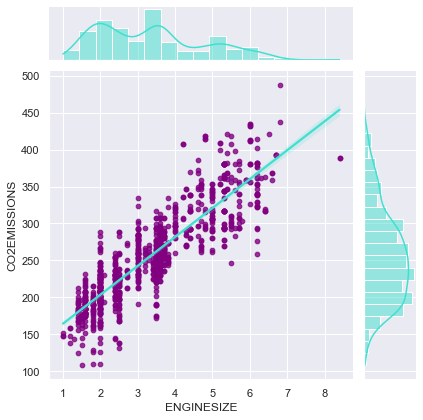

In [11]:
sns.jointplot(data = df, x = 'ENGINESIZE', y = 'CO2EMISSIONS',
              kind = 'reg', color = 'turquoise',
              scatter_kws = {'color': 'purple', 's':22});

### Model Kurulumu (GBM)

In [13]:
df1 = df[['ENGINESIZE', 'CYLINDERS', 'FUELCONSUMPTION_CITY', 'FUELCONSUMPTION_HWY', 'FUELCONSUMPTION_COMB', 'FUELCONSUMPTION_COMB_MPG', 'CO2EMISSIONS']] # sürekli degiskenler
df1.head()

,ENGINESIZE,CYLINDERS,FUELCONSUMPTION_CITY,FUELCONSUMPTION_HWY,FUELCONSUMPTION_COMB,FUELCONSUMPTION_COMB_MPG,CO2EMISSIONS
0,2.0,4,9.9,6.7,8.5,33,196
1,2.4,4,11.2,7.7,9.6,29,221
2,1.5,4,6.0,5.8,5.9,48,136
3,3.5,6,12.7,9.1,11.1,25,255
4,3.5,6,12.1,8.7,10.6,27,244


In [14]:
X = df1.drop('CO2EMISSIONS', axis = 1) # bagımsız degiskenler (co2emissions haricindekiler)
y = df1['CO2EMISSIONS'] # bagımsız degisken

# %20 egitim seti, %80 test seti
X_train, X_test, y_train, y_test = train_test_split(X,
                                                   y,
                                                   test_size = 0.20,
                                                   random_state = 42)
# optimum parametrelerin bulunması,
gbm_params = {'learning_rate': [0.001, 0.01, 0.1],
             'max_depth': [1, 3, 5],
             'n_estimators': [500, 1000, 2000],
             'subsample': [0.5, 0.75, 1]}

# modelin olusturulması ve fit edilmesi
gbm = GradientBoostingRegressor()
gbm_cv_model = GridSearchCV(gbm,
                            gbm_params,
                            cv = 10,
                            n_jobs = -1).fit(X_train, y_train)

gbm_cv_model # uzun sürebilir! (7-8 dk)

GridSearchCV(cv=10, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 3, 5],
                         'n_estimators': [500, 1000, 2000],
                         'subsample': [0.5, 0.75, 1]})

In [15]:
gbm_cv_model.best_params_

{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 1000, 'subsample': 0.5}

In [16]:
gbm_model = GradientBoostingRegressor(learning_rate = 0.01,
                                     max_depth = 5,
                                     n_estimators = 1000,
                                     subsample = 0.5).fit(X_train, y_train)
# model basarı ve hata degeri,
score = gbm_model.score(X_train, y_train)

y_pred = gbm_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [17]:
print(f"GBM modelin hata degeri: {rmse} ve basarı skoru: {score}")

GBM modelin hata degeri: 10.710996121948064 ve basarı skoru: 0.9971389240706566


### Model Kurulumu (XGBoost)

In [26]:
X = df1.drop('CO2EMISSIONS', axis = 1) # bagımsız degiskenler (co2emissions haricindekiler)
y = df1['CO2EMISSIONS'] # bagımsız degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)
# optimum parametrelerin bulunması,
xgb_params = {'learning_rate': [0.001, 0.01, 0.1],
             'max_depth': [1, 3, 5],
             'n_estimators': [500, 1000, 2000],
             'subsample': [0.5, 0.75, 1]}

# modelin olusturulması ve fit edilmesi
xgbmodel = XGBRegressor()
xgb_cv = GridSearchCV(xgbmodel,
                      xgb_params, 
                      cv = 10, 
                      n_jobs = -1).fit(X_train, y_train) # cok uzun sürebilir! (15-20 dk)

xgb_cv

GridSearchCV(cv=10,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, monotone_constraints=None,
                                    n_estimators=100, n_jobs=None,
                                    num_parallel_tree=None, random_state=None,
                                    reg_alpha=None, reg_lambda=None,
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_par

In [30]:
xgb_cv.best_params_ # optimum parametreler

{'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 2000, 'subsample': 1}

In [31]:
# optimum parametreler ile model kurulumu
xgb = XGBRegressor(learning_rate = 0.01,
                  max_depth = 5,
                  n_estimators = 2000,
                  subsample = 1).fit(X_train, y_train)

# modelin basarı ve hata degeri,
score = xgb.score(X_train, y_train)

y_pred = xgb.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [32]:
print(f"XGBoost modelin hata degeri: {rmse} ve basarı skoru: {score}")

XGBoost modelin hata degeri: 9.77632862701083 ve basarı skoru: 0.9982412649592204


### Model Kurulumu (Light GBM)

In [33]:
X = df1.drop('CO2EMISSIONS', axis = 1) # bagımsız degiskenler (co2emissions haricindekiler)
y = df1['CO2EMISSIONS'] # bagımsız degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)
# optimum parametrelerin bulunması,
lightgb_params = {'learning_rate': [0.001, 0.01, 0.1],
             'max_depth': [1, 3, 5],
             'n_estimators': [500, 1000, 2000],
             'subsample': [0.5, 0.75, 1]}

# modelin olusturulması ve fit edilmesi
light_gb = LGBMRegressor()
lightgb_cv = GridSearchCV(light_gb,
                          lightgb_params, 
                          cv = 10, 
                          n_jobs = -1).fit(X_train, y_train) # uzun sürebilir! (4-5 dk)

lightgb_cv

GridSearchCV(cv=10, estimator=LGBMRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.001, 0.01, 0.1],
                         'max_depth': [1, 3, 5],
                         'n_estimators': [500, 1000, 2000],
                         'subsample': [0.5, 0.75, 1]})

In [35]:
lightgb_cv.best_params_ # optimum parametreler

{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 1000, 'subsample': 0.5}

In [36]:
# optimum degerler ile model kurulumu
lightgb_model = LGBMRegressor(learning_rate = 0.1,
                             max_depth = 5,
                             n_estimators = 1000,
                             subsample = 0.5).fit(X_train, y_train)

# modelin basarı ve hata degeri,
score = lightgb_model.score(X_train, y_train)

y_pred = lightgb_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

In [47]:
print(f"Light GBM modelin hata degeri: {rmse} ve basarı skoru: {score}")

Light GBM modelin hata degeri: 9.681457108984334 ve basarı skoru: 0.9968937938612316


### Model Kurulumu (CatBoost)

In [ ]:
X = df1.drop('CO2EMISSIONS', axis = 1) # bagımsız degiskenler (co2emissions haricindekiler)
y = df1['CO2EMISSIONS'] # bagımsız degisken

# %80 egitim, %20 test seti,
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size = 0.20,
                                                    random_state = 42)
# optimum parametrelerin bulunması,
catb_params = {
    'iterations': [500, 1000, 2000],
    'learning_rate': [0.001, 0.01, 0.1],
    'depth': [1, 3, 5]}

# modelin olusturulması ve fit edilmesi
catb = CatBoostRegressor()
catb_cv = GridSearchCV(catb,
                       catb_params, 
                       cv = 5, 
                       n_jobs = -1).fit(X_train, y_train) # uzun sürebilir! (15-20dk)
catb_cv

0:	learn: 63.1756715	total: 46.6ms	remaining: 23.3s
1:	learn: 62.7862516	total: 47ms	remaining: 11.7s
2:	learn: 62.3930276	total: 47.3ms	remaining: 7.84s
3:	learn: 62.0014036	total: 47.6ms	remaining: 5.91s
4:	learn: 61.6524888	total: 48ms	remaining: 4.75s
5:	learn: 61.2772014	total: 48.3ms	remaining: 3.98s
6:	learn: 60.9123894	total: 48.6ms	remaining: 3.42s
7:	learn: 60.5408621	total: 49ms	remaining: 3.01s
8:	learn: 60.1699774	total: 49.3ms	remaining: 2.69s
9:	learn: 59.8135407	total: 49.6ms	remaining: 2.43s
10:	learn: 59.4551682	total: 49.9ms	remaining: 2.22s
11:	learn: 59.0976946	total: 50.2ms	remaining: 2.04s
12:	learn: 58.7543048	total: 50.4ms	remaining: 1.89s
13:	learn: 58.4083908	total: 53.8ms	remaining: 1.87s
14:	learn: 58.0715139	total: 71.4ms	remaining: 2.31s
15:	learn: 57.7414220	total: 73.8ms	remaining: 2.23s
16:	learn: 57.4048005	total: 74ms	remaining: 2.1s
17:	learn: 57.0800599	total: 74.3ms	remaining: 1.99s
18:	learn: 56.7603006	total: 76ms	remaining: 1.92s
19:	learn: 56.

In [44]:
catb_cv.best_params_

{'depth': 5, 'iterations': 500, 'learning_rate': 0.1}

In [46]:
# optimum degerler ile model kurulumu
catb_model = CatBoostRegressor(learning_rate = 0.1,
                               depth = 5,
                               iterations = 500).fit(X_train, y_train)

# modelin basarı ve hata degeri,
score = catb_model.score(X_train, y_train)

y_pred = catb_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

0:	learn: 58.3207931	total: 394us	remaining: 197ms
1:	learn: 53.8133631	total: 955us	remaining: 238ms
2:	learn: 49.8557324	total: 1.35ms	remaining: 223ms
3:	learn: 46.0662678	total: 1.72ms	remaining: 213ms
4:	learn: 42.6258121	total: 2.07ms	remaining: 205ms
5:	learn: 39.5844072	total: 2.43ms	remaining: 200ms
6:	learn: 36.7630987	total: 2.79ms	remaining: 196ms
7:	learn: 34.3709268	total: 3.18ms	remaining: 196ms
8:	learn: 32.1602112	total: 3.61ms	remaining: 197ms
9:	learn: 30.2205128	total: 3.98ms	remaining: 195ms
10:	learn: 28.4867248	total: 4.32ms	remaining: 192ms
11:	learn: 27.1134695	total: 4.66ms	remaining: 189ms
12:	learn: 25.8012266	total: 5ms	remaining: 187ms
13:	learn: 24.7070949	total: 5.35ms	remaining: 186ms
14:	learn: 23.7092784	total: 5.68ms	remaining: 184ms
15:	learn: 22.7862737	total: 6.06ms	remaining: 183ms
16:	learn: 21.9751448	total: 6.38ms	remaining: 181ms
17:	learn: 21.2300724	total: 6.73ms	remaining: 180ms
18:	learn: 20.6266665	total: 7.04ms	remaining: 178ms
19:	lear

In [48]:
print(f"CatBoost modelin hata degeri: {rmse} ve basarı skoru: {score}")

CatBoost modelin hata degeri: 9.681457108984334 ve basarı skoru: 0.9968937938612316


### Sonuç

* GBM modelin hata degeri: **10.710996121948064** ve basarı skoru: 0.9971389240706566
* XGBoost modelin hata degeri: **9.77632862701083** ve basarı skoru: 0.9982412649592204
* Light GBM modelin hata degeri: **9.681457108984334** ve basarı skoru: 0.9968937938612316
* CatBoost modelin hata degeri: **9.681457108984334** ve basarı skoru: 0.9968937938612316